# Deteccion y Comparacion de Fuentes de las imagenes obtenidas con PhoSim

### Por Sergio Daniel Hernandez Charpak

## Deteccion de Fuentes sobre las imagenes simuladas

In [60]:
%pylab inline
import sep #http://sep.readthedocs.org/
import os 
from astropy.io import fits
import glob

Populating the interactive namespace from numpy and matplotlib


In [65]:
path_imagenes = '../../PruebaImagenes/w13_diffim_v11/calexp/v6866601-fi/R22/S20.fits'

In [62]:
#pha_list = fits.open('../../PruebaImagenes/w13_diffim_v11/src/v6866602-fi/R22/S11.fits')
pha_list = fits.open('../../PruebaImagenes/w13_diffim_v11/calexp/v6866601-fi/R22/S20.fits')
pha_list.info()

Filename: ../../PruebaImagenes/w13_diffim_v11/calexp/v6866601-fi/R22/S20.fits
No.    Name         Type      Cards   Dimensions   Format
0    PRIMARY     PrimaryHDU     347   ()              
1                ImageHDU        33   (4000, 4072)   float32   
2                ImageHDU        44   (4000, 4072)   int16   
3                ImageHDU        33   (4000, 4072)   float32   
4                BinTableHDU     40   16R x 7C     [1J, 1J, 1J, 1J, 1J, 64A, 64A]   
5                BinTableHDU     20   4R x 2C      [64A, 1J]   
6                BinTableHDU     41   2R x 6C      [1J, 1J, 1J, 1J, 1J, 9D]   
7                BinTableHDU     41   2R x 6C      [1J, 1J, 1J, 1J, 1J, 1D]   
8                BinTableHDU     26   1R x 3C      [1J, 1D, 1D]   
9                BinTableHDU     40   1R x 6C      [1J, 1J, 1J, 1J, 4J, 4J]   
10               BinTableHDU     39   4R x 5C      [6D, 1D, 1D, 1D, 1D]   
11               BinTableHDU     39   4R x 5C      [1J, 1J, 1J, 1J, 625D]   
12            

In [4]:
pha_data_4=pha_list[4].data
#columnas
print pha_list[12].columns

ColDefs(
    name = 'crval_x'; format = '1D'; unit = 'degrees'
    name = 'crval_y'; format = '1D'; unit = 'degrees'
    name = 'crpix_x'; format = '1D'; unit = 'pixels'
    name = 'crpix_y'; format = '1D'; unit = 'pixels'
    name = 'cd'; format = '4D'
    name = 'ctype1'; format = '72A'
    name = 'ctype2'; format = '72A'
    name = 'equinox'; format = '1D'
    name = 'radesys'; format = '72A'
    name = 'cunit1'; format = '72A'
    name = 'cunit2'; format = '72A'
)


In [5]:
pha_data_1 = pha_list[1].data
print shape(pha_data_1)

(4072, 4000)


<matplotlib.colorbar.Colorbar instance at 0x7f00a8570cb0>

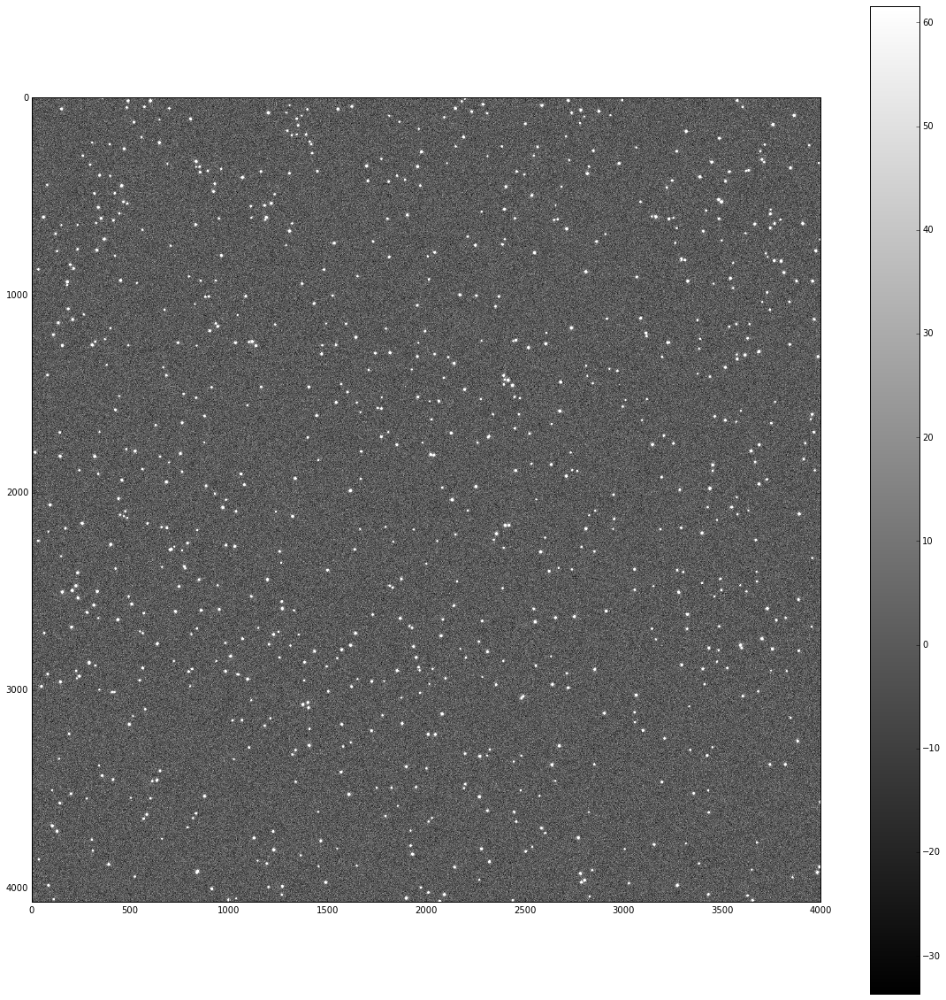

In [6]:
figure(figsize = (20,20))
imshow(pha_data_1, cmap='gray', vmin=-33.627594,vmax=61.58709)
colorbar()

In [7]:
data=pha_data_1
shape_data=shape(data)

In [8]:
#Background
try:
    bkg = sep.Background(data)
except ValueError:
    data = data.byteswap().newbyteorder()
    bkg = sep.Background(data)

In [9]:
#Source detection

thresh = 2.0 * bkg.globalrms
objects = sep.extract(data, thresh) # objects is a numpy structured array

num_objects = len(objects)
print num_objects # number of objects

851


In [10]:
#Objetos Resultados
print(objects.dtype.names)

('thresh', 'npix', 'tnpix', 'xmin', 'xmax', 'ymin', 'ymax', 'x', 'y', 'x2', 'y2', 'xy', 'a', 'b', 'theta', 'cxx', 'cyy', 'cxy', 'cflux', 'flux', 'cpeak', 'peak', 'xcpeak', 'ycpeak', 'xpeak', 'ypeak', 'flag')


In [11]:
objects_x = []
objects_y = []

for i in range(num_objects):
    x = objects['x'][i]
    y = objects['y'][i]
    
    objects_x.append(x)
    objects_y.append(y)
    
objects_x = array(objects_x)
objects_y = array(objects_y)

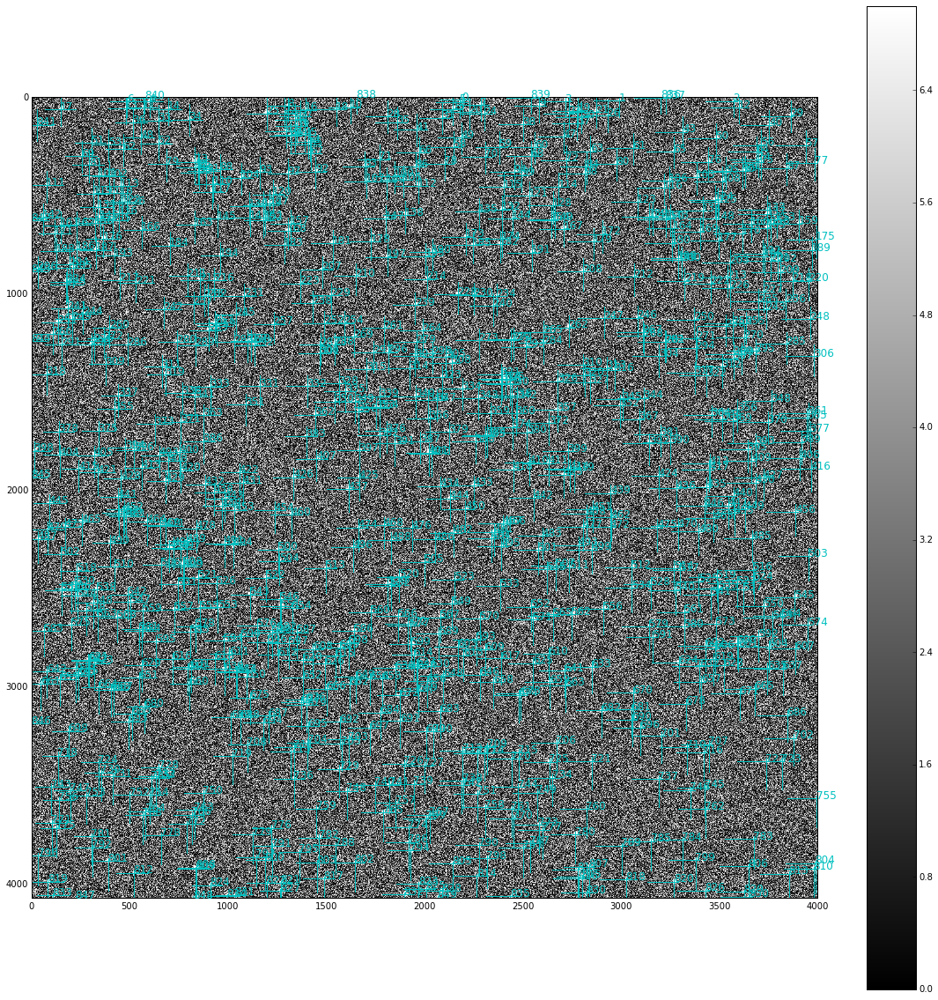

In [12]:
x_max = shape_data[0]
y_max = shape_data[1]

fig = figure(figsize=(20,20))
imshow(data, cmap='gray',vmin=0,vmax=7)
colorbar()

for i in range(len(objects)):
    x = objects_x[i]
    y = objects_y[i]
    
    porc_x = x/float(x_max)
    porc_y = 1-y/float(y_max)
    
    axvline(x,porc_y-0.02,porc_y+0.02,c='c')
    axhline(y,porc_x-0.02,porc_x+0.02,c='c') 
    text(x+1,y+1,str(i),color='c',fontsize=12)
    
#savefig(path_imagenes+'fuentes.png', bbox_inches='tight')
#close()

## Comparacion con las fuentes de la simulacion

In [13]:
#Comparar con los datos de la carpeta src
pha_list_src = fits.open('../../PruebaImagenes/w13_diffim_v11/src/v6866601-fi/R22/S20.fits')
pha_list_src.info()

Filename: ../../PruebaImagenes/w13_diffim_v11/src/v6866601-fi/R22/S20.fits
No.    Name         Type      Cards   Dimensions   Format
0    PRIMARY     PrimaryHDU       6   ()              
1                BinTableHDU    426   817R x 56C   [59X, 1K, 1D, 1D, 1K, 1D, 1D, 1D, 1D, 1D, 1D, 1E, 1E, 1D, 1D, 1D, 1E, 1E, 1E, 1D, 1D, 1D, 1D, 1E, 1E, 1E, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1D, 1J]   
2                BinTableHDU     40   1634R x 7C   [1J, 1J, 1J, 1J, 1J, 64A, 64A]   
3                BinTableHDU    843   18052R x 3C   [1J, 1J, 1J]   
4                BinTableHDU    857   880R x 6C    [1K, 1E, 1E, 1J, 1J, 1E]   


In [14]:
pha_data_src=pha_list_src[1].data
#columnas
print pha_list_src[1].columns

ColDefs(
    name = 'flags'; format = '59X'
    name = 'id'; format = '1K'
    name = 'coord_ra'; format = '1D'
    name = 'coord_dec'; format = '1D'
    name = 'parent'; format = '1K'
    name = 'base_GaussianCentroid_x'; format = '1D'; unit = 'pixels'
    name = 'base_GaussianCentroid_y'; format = '1D'; unit = 'pixels'
    name = 'base_NaiveCentroid_x'; format = '1D'; unit = 'pixels'
    name = 'base_NaiveCentroid_y'; format = '1D'; unit = 'pixels'
    name = 'base_SdssCentroid_x'; format = '1D'; unit = 'pixels'
    name = 'base_SdssCentroid_y'; format = '1D'; unit = 'pixels'
    name = 'base_SdssCentroid_xSigma'; format = '1E'; unit = 'pixels'
    name = 'base_SdssCentroid_ySigma'; format = '1E'; unit = 'pixels'
    name = 'base_SdssShape_xx'; format = '1D'; unit = 'pixels^2'
    name = 'base_SdssShape_yy'; format = '1D'; unit = 'pixels^2'
    name = 'base_SdssShape_xy'; format = '1D'; unit = 'pixels^2'
    name = 'base_SdssShape_xxSigma'; format = '1E'; unit = 'pixels^2'
    name =

In [43]:
x_src=pha_data_src['base_GaussianCentroid_x']
y_src=pha_data_src['base_GaussianCentroid_y']
print len(x_src), len(y_src), min(x_src),max(x_src),min(y_src), max(y_src)

817 817 -1.43269867476 3995.65562937 -0.0948387476165 4069.67922387


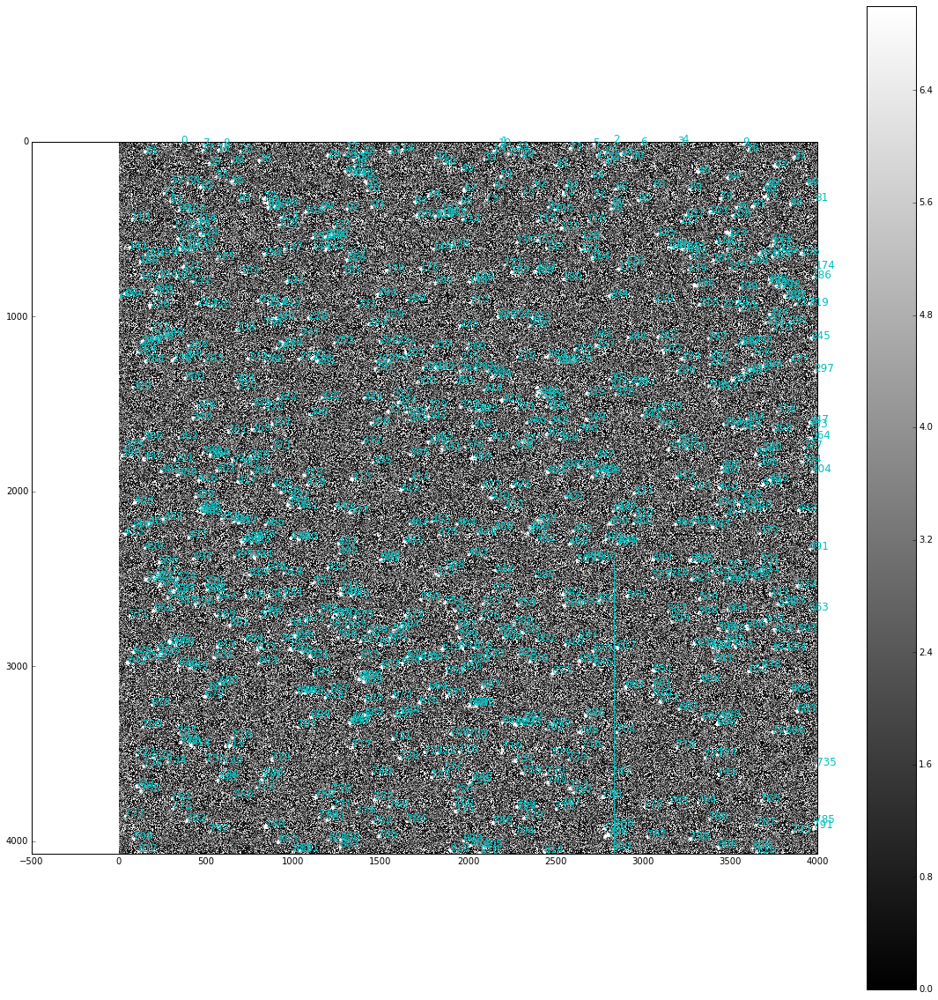

In [16]:
fig_1 = figure(figsize=(20,20))
imshow(data, cmap='gray',vmin=0,vmax=7)
colorbar()

for i in range(len(x_src)):
    x_f = x_src[i]
    y_f = y_src[i]

    axvline(x_f,y_f-0.5,y_f+0.5,c='c')
    axhline(y_f,x_f-0.5,x_f+0.5,c='c') 
    text(x_f+1,y_f+1,str(i),color='c',fontsize=12)
    
#savefig(path_imagenes+'fuentes.png', bbox_inches='tight')
#close()

In [40]:
umbral_comparacion=50.0 #si ambos puntos estan a +- esta distancia en x o y se consideran la misma fuente.
fuentes_comun_x=[]
fuentes_comun_y=[]
fuentes_distintas_sep_x=[]
fuentes_distintas_sep_y=[]
x_src_copy=x_src.copy()
y_src_copy=y_src.copy()
print "Shape simulacion", len(x_src_copy), len(y_src_copy)
print "Shape sep", len(objects_x), len(objects_y)
for i in range(len(objects)):
    sep_x,sep_y=objects_x[i],objects_y[i]
    match=0
    for j in range(len(x_src_copy)):
        sim_x,sim_y=x_src_copy[j],y_src_copy[j]
        #Ahora compara
        if((abs(sim_x-sep_x)<=umbral_comparacion)and(abs(sim_y-sep_y)<=umbral_comparacion)):
            print "mismo_objeto"
            print sim_x,sep_x
            print sim_y,sep_y
            fuentes_comun_x.append((sim_x + sep_x)/2.0)
            fuentes_comun_y.append((sim_y + sep_y)/2.0)
            x_copy=delete(x_src_copy,j)
            y_copy=delete(y_src_copy,j)
            x_src_copy=x_copy
            y_src_copy=y_copy
            match=1
            break
    #No encontro ningun match
    if(match==0):
        fuentes_distintas_sep_x.append(sep_x)
        fuentes_distintas_sep_y.append(sep_y)
num_common_objects= len(fuentes_comun_x)
print "Shape distintas simulacion", len(x_src_copy), len(y_src_copy)
print "Shape distintas sep", len(fuentes_distintas_sep_x), len(fuentes_distintas_sep_y)
print "Shape comunes", len(fuentes_comun_x), len(fuentes_comun_y)

Shape simulacion 817 817
Shape sep 851 851
mismo_objeto
2193.62870222 2193.63023533
11.5362256461 11.537839991
mismo_objeto
2991.42542835 2991.4183162
17.8878330684 17.9008074516
mismo_objeto
3572.76902973 3572.76015008
19.2085101692 19.1979549649
mismo_objeto
2717.1695302 2717.19950407
19.9930878789 19.9565019788
mismo_objeto
600.96927198 600.955799306
21.2746847906 21.270256634
mismo_objeto
2177.82176593 2177.85407577
24.0163845023 23.9931387685
mismo_objeto
487.722617701 487.710135859
21.7747803567 21.7764683546
mismo_objeto
2285.78352791 2285.80274218
39.2888105337 39.2893222917
mismo_objeto
1305.64259248 1305.69252387
43.5319757548 43.5216378885
mismo_objeto
2583.80372615 2583.79669307
44.4750969782 44.4892356368
mismo_objeto
1621.31542553 1621.33367975
49.3952642079 49.4135717098
mismo_objeto
569.796246847 569.786434896
51.4792031055 51.4332706101
mismo_objeto
3600.25417418 3600.31933894
52.1941690512 52.203608225
mismo_objeto
480.751191308 480.707827988
55.1373328163 55.11815428

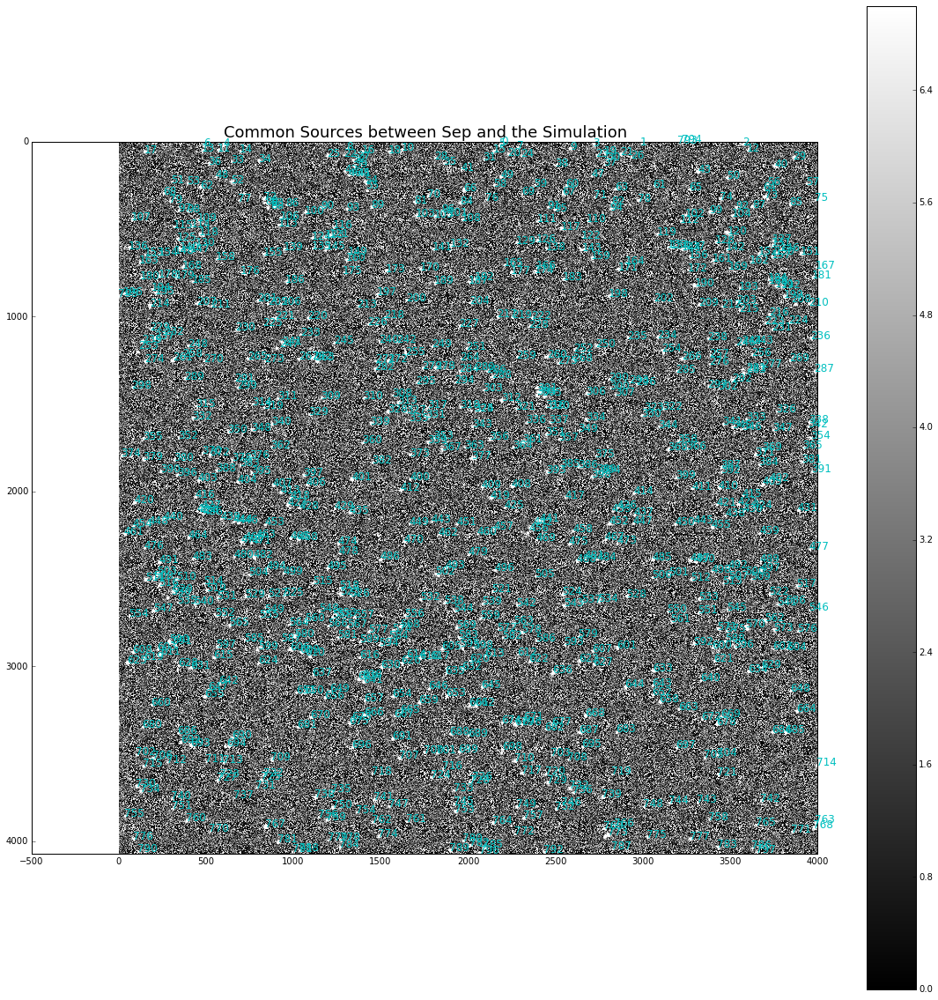

In [39]:
#Ahora grafica las comunes
fig_2 = figure(figsize=(20,20))
imshow(data, cmap='gray',vmin=0,vmax=7)
title("Common Sources between Sep and the Simulation", fontsize=18)
colorbar()

for i in range(len(fuentes_comun_x)):
    x_f = fuentes_comun_x[i]
    y_f = fuentes_comun_y[i]

    axvline(x_f,y_f-0.5,y_f+0.5,c='c')
    axhline(y_f,x_f-0.5,x_f+0.5,c='c') 
    text(x_f+1,y_f+1,str(i),color='c',fontsize=12)
    

#Curva sobre fuentes

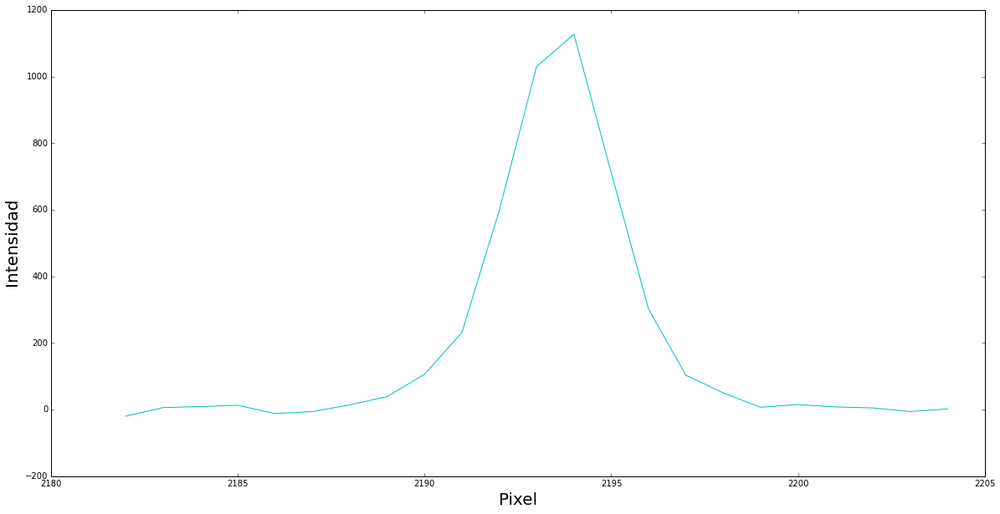

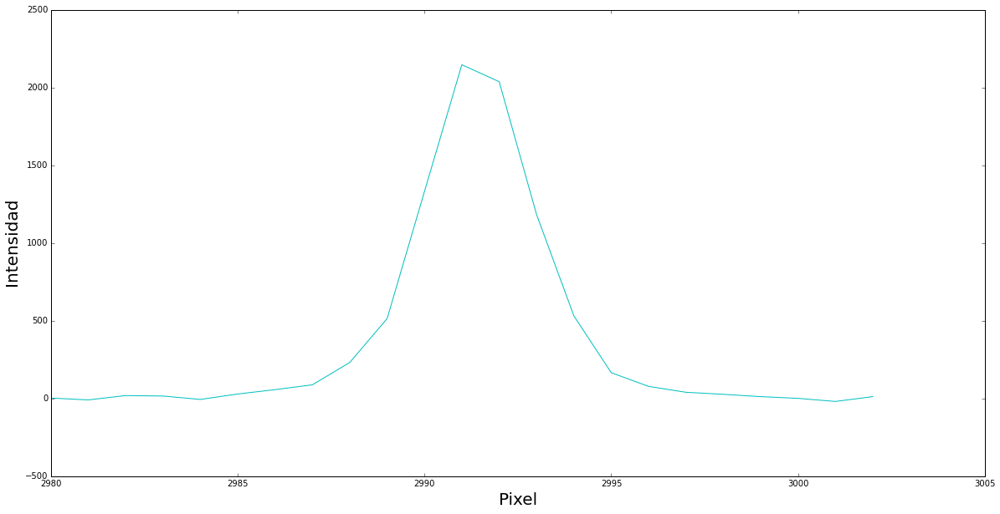

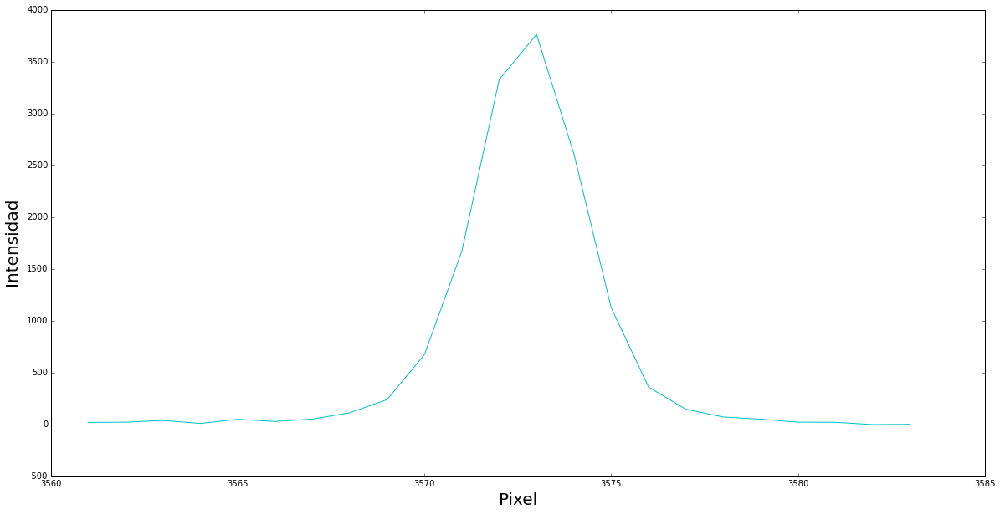

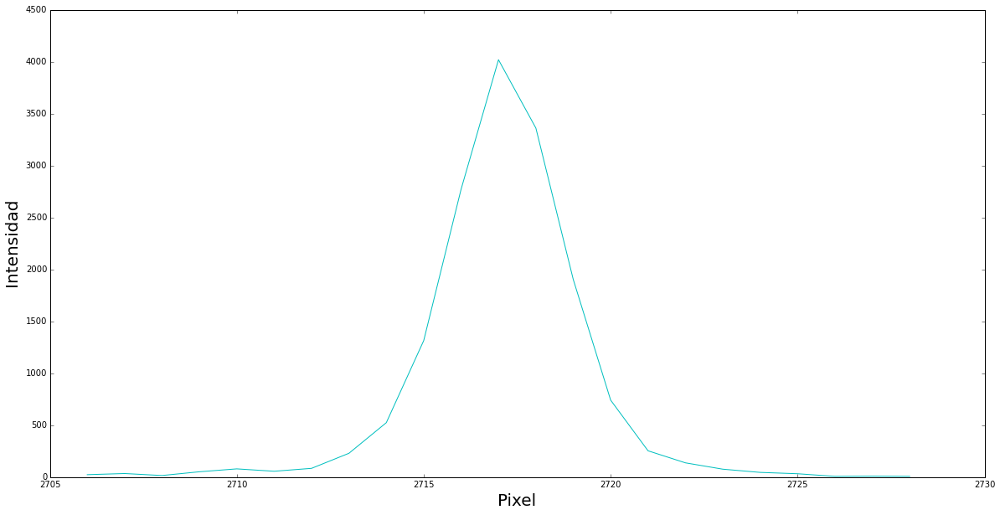

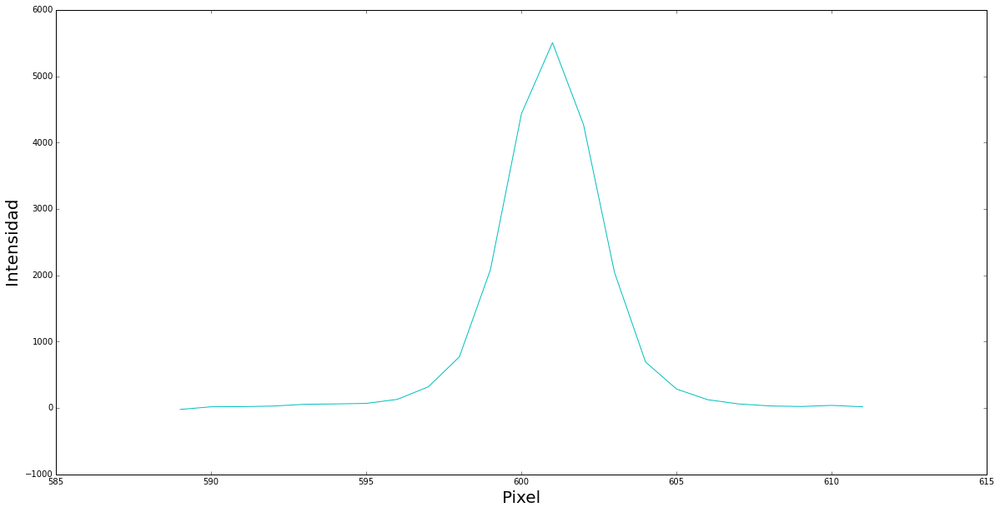

...

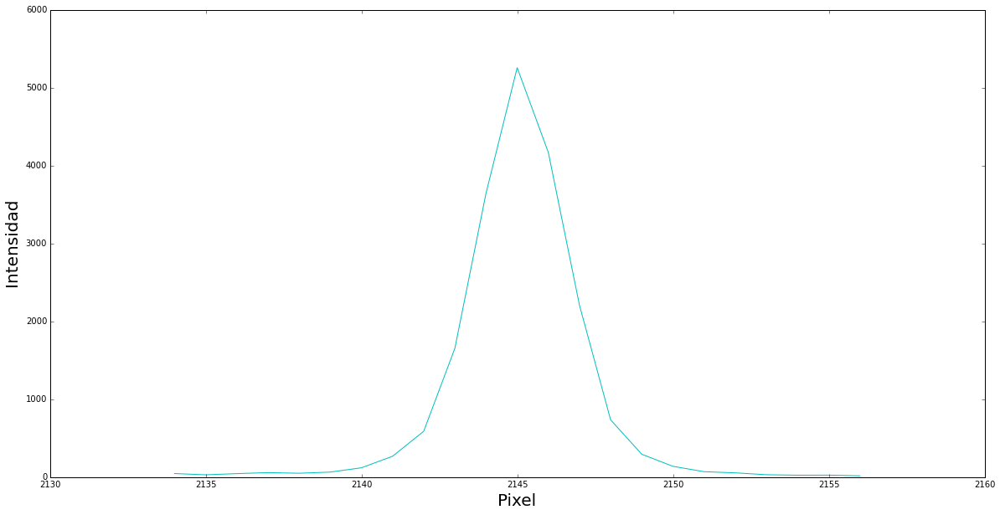

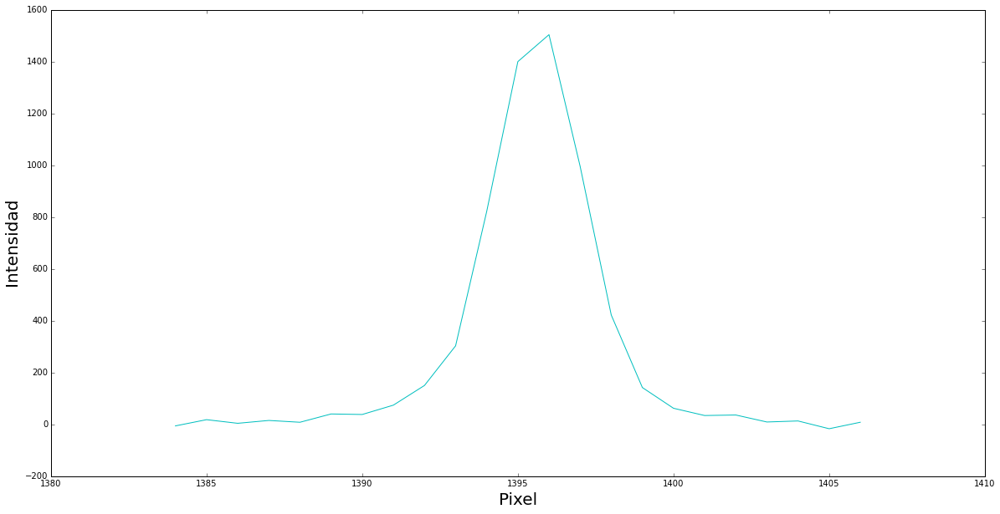

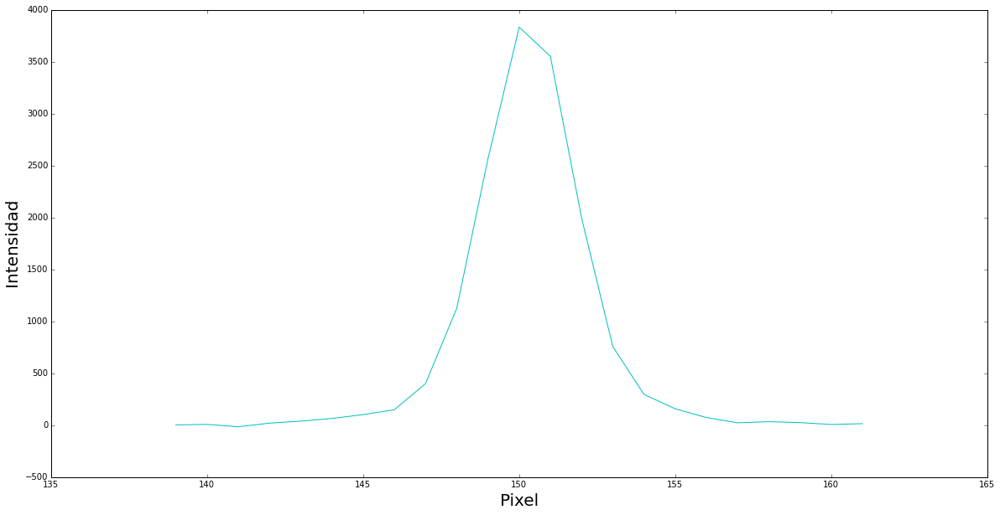

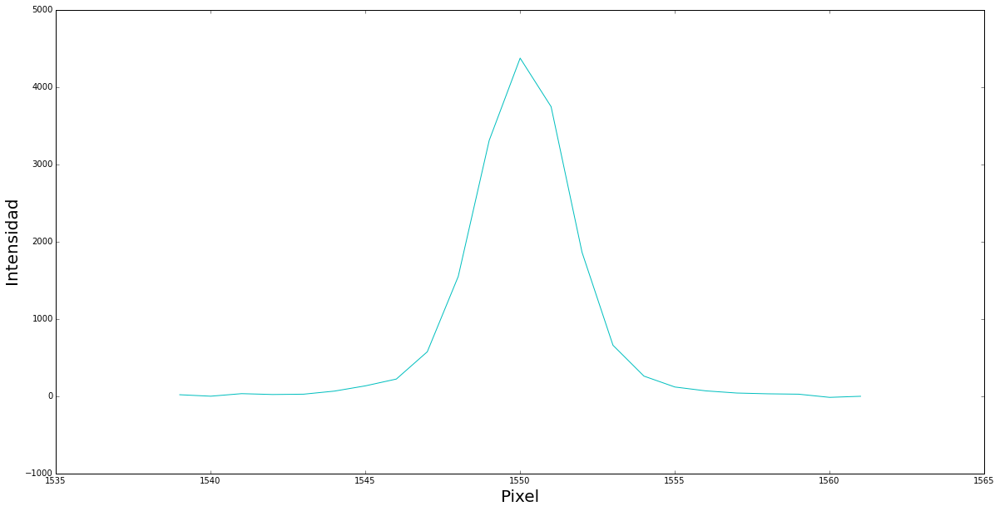

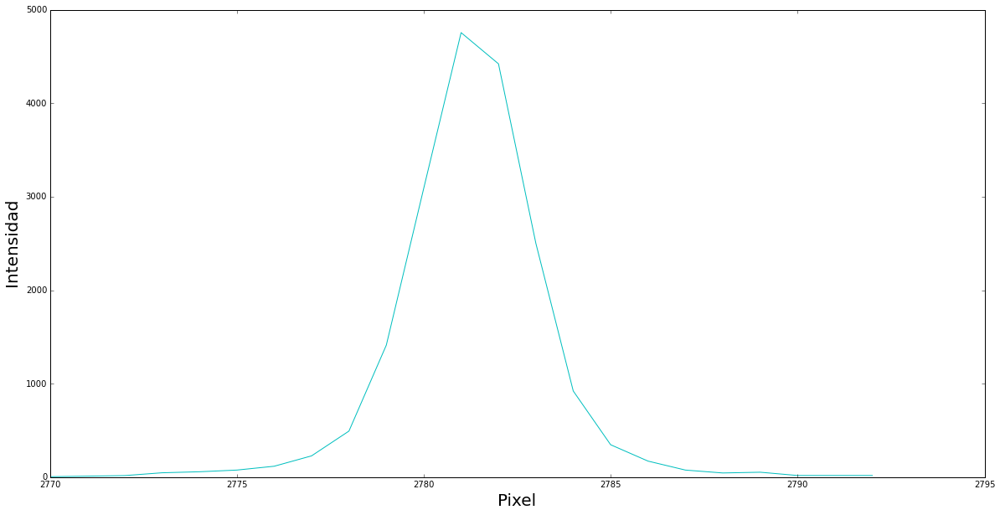

In [70]:
common_objects_x_int = array([int(ox) for ox in fuentes_comun_x])
common_objects_y_int = array([int(oy) for oy in fuentes_comun_y])
for i in range(num_common_objects):

    fila = common_objects_x_int[i]
    columna = common_objects_y_int[i]
    
    arreglo_pixel = zeros(23)
    arreglo_intensidad = zeros(23)
    indice_arreglos = 0
    
    if (fila-12 < 0):
        for lin in range(0,fila+11+1):
            pixel = data[lin][columna]
            arreglo_pixel[indice_arreglos] = lin
            arreglo_intensidad[indice_arreglos] = pixel
            indice_arreglos += 1
            
    elif (fila+12 > shape_data[1]):
        for lin in range(fila-11,shape_data[1]):
            pixel = data[lin][columna]
            arreglo_pixel[indice_arreglos] = lin
            arreglo_intensidad[indice_arreglos] = pixel
            indice_arreglos += 1

    else:
        for lin in range(fila-11,fila+11+1):
            try:
                pixel = data[columna][lin]
                arreglo_pixel[indice_arreglos] = lin
                arreglo_intensidad[indice_arreglos] = pixel
                indice_arreglos += 1
            except Exception:
                print shape(data), shape(arreglo_pixel), shape(arreglo_intensidad)
                print lin, columna, fila, indice_arreglos
    
    
    fig = figure(figsize=(20,10))
    plot(arreglo_pixel,arreglo_intensidad,c='c')
    xlabel('Pixel',fontsize=20)
    ylabel('Intensidad',fontsize=20)
    plt.savefig('./curvas_sobre_fuentes/'+'S20/'+str(i)+'.png')
    close()

#Curvas de luz

In [16]:
path = '../../data_marcosmo/aligned/supernova_subtract/'
visitas = sort(os.listdir(path))

num_visitas = len(visitas)

In [20]:
print visitas

['+1.fits' '+3.fits' '-1,2.fits' '-2,2.fits' '-3.fits' '-4.fits' '0.fits']


In [17]:
objects_x_int = array([int(ox) for ox in objects_x])
objects_y_int = array([int(oy) for oy in objects_y])

In [18]:
curvas = zeros((num_objects,num_visitas))

In [23]:
for v in range(num_visitas):
            
    visita = fits.open(path+visitas[v])
    ccd14 = visita[1].data
    ccd14 = ccd14*65000/amax(ccd14) #Normalizando, no estoy segura si debería ir ahi
       
    for i in range(num_objects):
        
        columna = objects_x_int[i]
        fila = objects_y_int[i]
        
        pixel = ccd14[fila][columna]
            
        curvas[i][v] = pixel

    visita.close()

In [25]:
vis = arange(num_visitas)

for i in range(num_objects):
    intensidad = curvas[i][:]
    
    fig = figure(figsize=(20,10))
    scatter(vis,intensidad)
    plot(vis,intensidad,c='c')
    xlabel('Visita',fontsize=20)
    ylabel('Intensidad',fontsize=20)
    xlim(0,num_visitas-1)
    ylim(-amax(intensidad)*0.01,amax(intensidad)*1.01)
    savefig(path_imagenes+'curvas_de_luz/'+str(i)+'.png')
    close()